# A look of Dataset

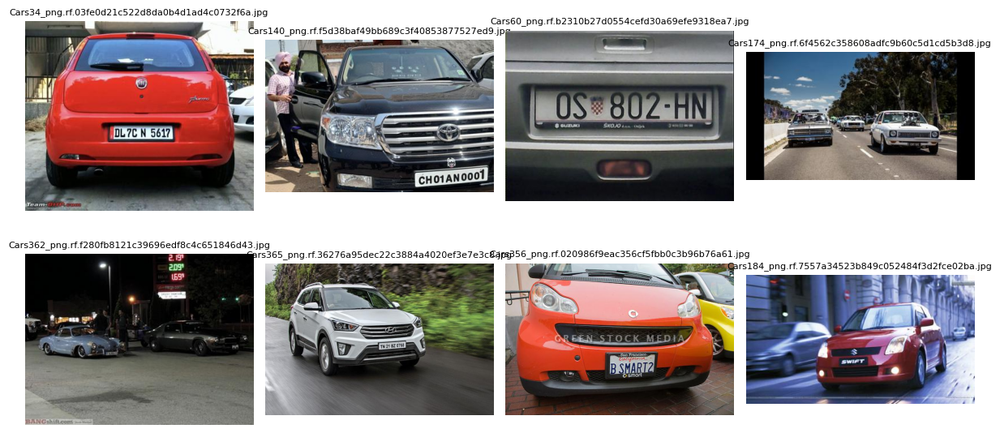

In [33]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import os
import random

def display_sample_images(folder_path, num_images=8):
    # Get list of all image files in the folder
    image_files = [f for f in os.listdir(folder_path) if os.path.isfile(os.path.join(folder_path, f))]
    
    # Randomly sample a subset of image files
    sampled_files = random.sample(image_files, num_images)
    
    # Set up the subplot grid
    fig, axes = plt.subplots(2, 4, figsize=(12, 6))
    axes = axes.flatten()
    
    # Display each image in the subplot
    for img_file, ax in zip(sampled_files, axes):
        img_path = os.path.join(folder_path, img_file)
        img = mpimg.imread(img_path)
        ax.imshow(img)
        ax.axis('off')
        ax.set_title(img_file, fontsize=8)
    
    plt.tight_layout()
    plt.show()

# Usage example
folder_path = r'car_license_plate.v1i.yolov8\train\images'
display_sample_images(folder_path)


# Model Training

In [ ]:
import os
from ultralytics import YOLO

model = YOLO("yolov8n.yaml")

results = model.train(data=os.path.join(root_path, "config.yaml"), epochs=100, imgsz = 480)

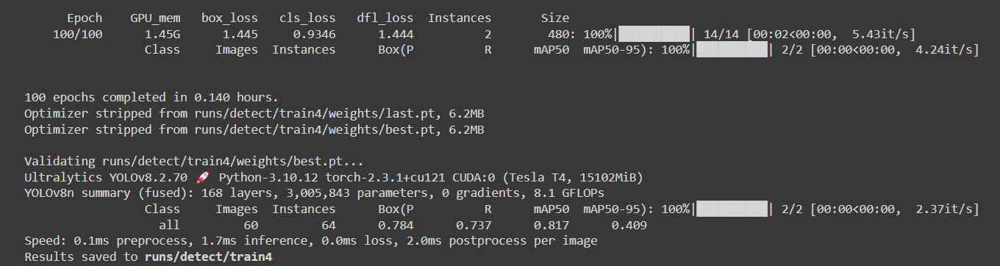

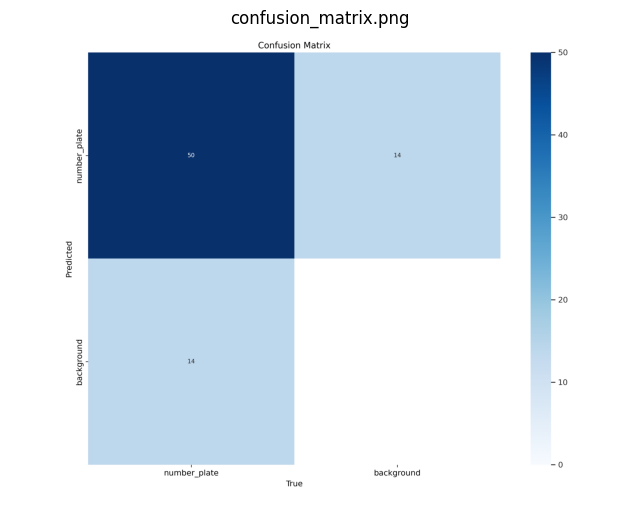

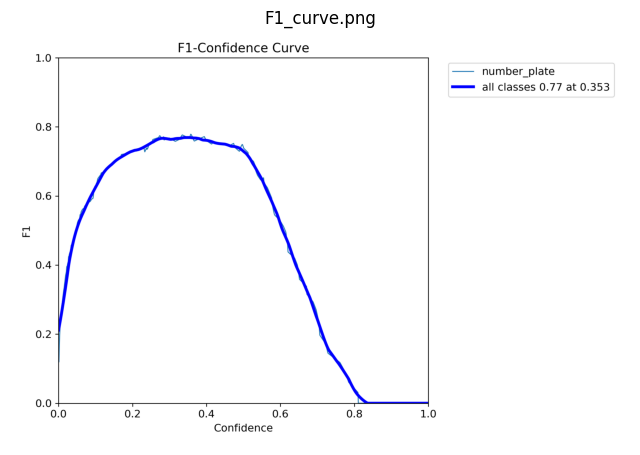

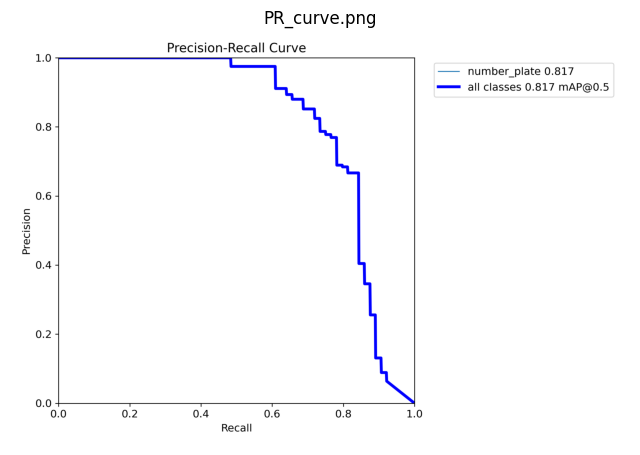

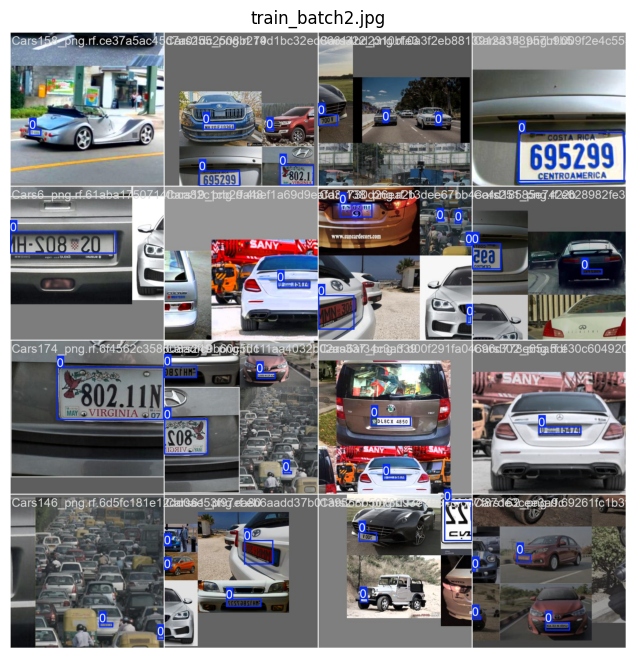

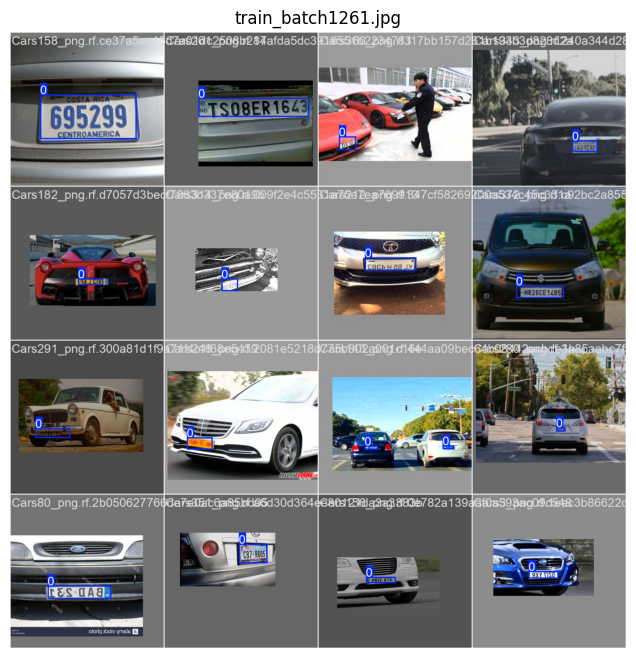

In [37]:
from PIL import Image
import matplotlib.pyplot as plt
import os

# Path to the folder containing images
folder_path = r'C:\Users\mughe\ml1\!ML 1 Bootcamp\Number_Plate_Retreival\runs\detect\train4'

# List of image file names to display
image_names = ['confusion_matrix.png', 'F1_curve.png', 'PR_curve.png', 'train_batch2.jpg', 'train_batch1261.jpg']

# Display the images
for i, image_name in enumerate(image_names):
    plt.figure(figsize=(8, 8))
    img_path = os.path.join(folder_path, image_name)
    img = Image.open(img_path)
    plt.imshow(img)
    plt.axis('off')
    plt.title(image_name)
plt.show()


# Model Testing

In [1]:
import os
import random
import cv2
import matplotlib.pyplot as plt
from ultralytics import YOLO


In [2]:
def detect_objects(image, model, threshold=0.15):
    results = model(image)[0]
    detections = []
    for x1, y1, x2, y2, score, class_id in results.boxes.data.tolist():
        if score > threshold:
            cv2.rectangle(image, (int(x1), int(y1)), (int(x2), int(y2)), (0, 255, 0), 4)
            detections.append((results.names[int(class_id)].upper(), score))
    return image, detections

def process_images(folder_path, model, num_images=16, threshold=0.4):
    image_files = [f for f in os.listdir(folder_path) if os.path.isfile(os.path.join(folder_path, f))]
    selected_images = random.sample(image_files, num_images)
    
    rows = (num_images + 3) // 4  # Calculate the number of rows needed
    fig, axs = plt.subplots(rows, 4, figsize=(20, 10))
    axs = axs.flatten()  # Ensure axs is a 1D array
    
    for i, image_file in enumerate(selected_images):
        image_path = os.path.join(folder_path, image_file)
        image = cv2.imread(image_path)
        detected_image, detections = detect_objects(image, model, threshold)
        detected_image_rgb = cv2.cvtColor(detected_image, cv2.COLOR_BGR2RGB)
        
        ax = axs[i]
        ax.imshow(detected_image_rgb)
        ax.axis('off')
        
        detection_text = ", ".join([f'{cls} ({score:.2f})' for cls, score in detections]) if detections else "No detections"
        ax.set_title(f'{image_file}\n{detection_text}')
    
    for j in range(i + 1, len(axs)):
        fig.delaxes(axs[j])  # Remove any unused subplots
    
    plt.tight_layout()
    plt.show()


0: 320x480 (no detections), 82.3ms
Speed: 0.0ms preprocess, 82.3ms inference, 1.5ms postprocess per image at shape (1, 3, 320, 480)

0: 320x480 2 number_plates, 38.5ms
Speed: 12.0ms preprocess, 38.5ms inference, 0.0ms postprocess per image at shape (1, 3, 320, 480)

0: 256x480 1 number_plate, 52.2ms
Speed: 0.0ms preprocess, 52.2ms inference, 0.0ms postprocess per image at shape (1, 3, 256, 480)

0: 480x288 1 number_plate, 50.6ms
Speed: 0.0ms preprocess, 50.6ms inference, 0.0ms postprocess per image at shape (1, 3, 480, 288)

0: 384x480 1 number_plate, 51.5ms
Speed: 0.0ms preprocess, 51.5ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 480)

0: 256x480 2 number_plates, 47.6ms
Speed: 0.0ms preprocess, 47.6ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 480)


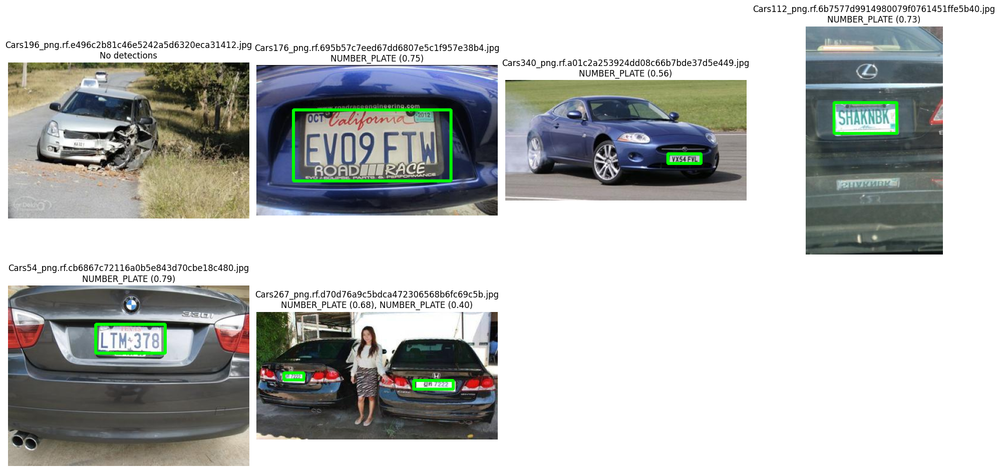

In [3]:
# Model and folder path
model = YOLO(os.path.join('.', 'best.pt'))
folder_path = r'C:\Users\mughe\ml1\!ML 1 Bootcamp\Number_Plate_Retreival\car_license_plate.v1i.yolov8\test\images'

# Process and plot images
process_images(folder_path, model, num_images=6)


### Single Image


0: 320x480 1 number_plate, 54.8ms
Speed: 2.1ms preprocess, 54.8ms inference, 1.4ms postprocess per image at shape (1, 3, 320, 480)


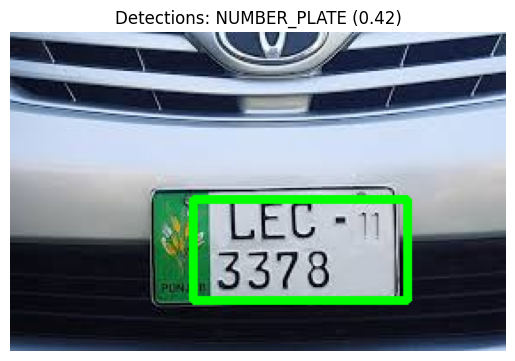

In [5]:
import cv2
from ultralytics import YOLO
import matplotlib.pyplot as plt

def detect_and_show_single_image(image_path, model, threshold=0.15):
    image = cv2.imread(image_path)
    results = model(image)[0]
    detections = []
    for x1, y1, x2, y2, score, class_id in results.boxes.data.tolist():
        if score > threshold:
            cv2.rectangle(image, (int(x1), int(y1)), (int(x2), int(y2)), (0, 255, 0), 4)
            detections.append(f"{results.names[int(class_id)].upper()} ({score:.2f})")
    return image, detections

# Example usage
model = YOLO(os.path.join('.', 'best.pt'))
image_path = r'download.jpeg'
detected_image, detections = detect_and_show_single_image(image_path, model)

# Convert BGR image to RGB for displaying with matplotlib
detected_image_rgb = cv2.cvtColor(detected_image, cv2.COLOR_BGR2RGB)

# Display the image with detections in the title
plt.imshow(detected_image_rgb)
plt.axis('off')
title = "Detections: " + ", ".join(detections) if detections else "No detections"
plt.title(title)
plt.show()


### Cropped Results


0: 320x480 1 number_plate, 182.1ms
Speed: 67.1ms preprocess, 182.1ms inference, 39.6ms postprocess per image at shape (1, 3, 320, 480)


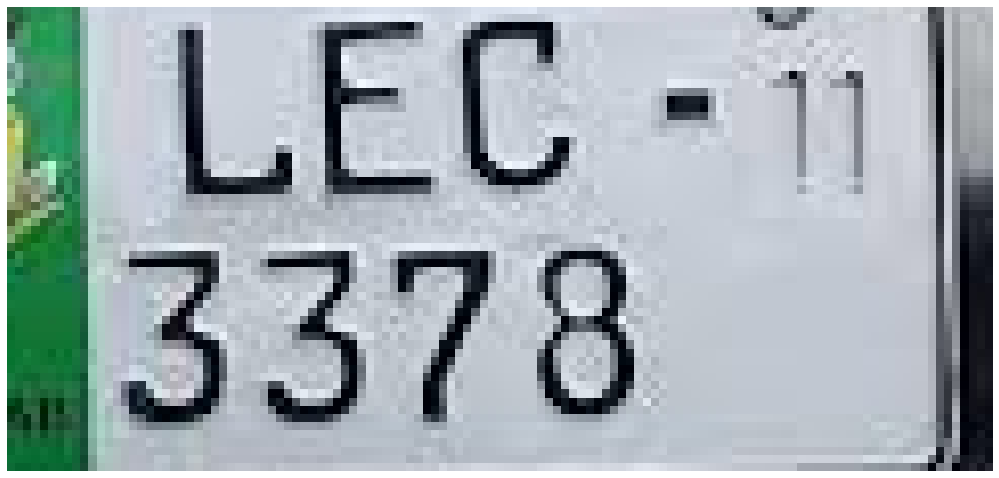

In [40]:
import cv2
from ultralytics import YOLO
import matplotlib.pyplot as plt

def detect_and_crop_single_image(image_path, model, threshold=0.15):
    image = cv2.imread(image_path)
    results = model(image)[0]
    cropped_images = []
    for x1, y1, x2, y2, score, class_id in results.boxes.data.tolist():
        if score > threshold:
            cropped_image = image[int(y1):int(y2), int(x1):int(x2)]
            cropped_images.append(cropped_image)
    return cropped_images

# Example usage
model = YOLO(os.path.join('.', 'best.pt'))
image_path = r'download.jpeg'
cropped_images = detect_and_crop_single_image(image_path, model)

# Display the cropped images
fig, axs = plt.subplots(1, len(cropped_images), figsize=(15, 15))
if len(cropped_images) == 1:
    axs = [axs]  # Ensure axs is iterable

for ax, cropped_image in zip(axs, cropped_images):
    cropped_image_rgb = cv2.cvtColor(cropped_image, cv2.COLOR_BGR2RGB)
    ax.imshow(cropped_image_rgb)
    ax.axis('off')

plt.tight_layout()
plt.show()


## Applying OCR

[2024/07/31 12:48:44] ppocr DEBUG: Namespace(help='==SUPPRESS==', use_gpu=False, use_xpu=False, use_npu=False, use_mlu=False, ir_optim=True, use_tensorrt=False, min_subgraph_size=15, precision='fp32', gpu_mem=500, gpu_id=0, image_dir=None, page_num=0, det_algorithm='DB', det_model_dir='C:\\Users\\mughe/.paddleocr/whl\\det\\en\\en_PP-OCRv3_det_infer', det_limit_side_len=960, det_limit_type='max', det_box_type='quad', det_db_thresh=0.3, det_db_box_thresh=0.6, det_db_unclip_ratio=1.5, max_batch_size=10, use_dilation=False, det_db_score_mode='fast', det_east_score_thresh=0.8, det_east_cover_thresh=0.1, det_east_nms_thresh=0.2, det_sast_score_thresh=0.5, det_sast_nms_thresh=0.2, det_pse_thresh=0, det_pse_box_thresh=0.85, det_pse_min_area=16, det_pse_scale=1, scales=[8, 16, 32], alpha=1.0, beta=1.0, fourier_degree=5, rec_algorithm='SVTR_LCNet', rec_model_dir='C:\\Users\\mughe/.paddleocr/whl\\rec\\en\\en_PP-OCRv4_rec_infer', rec_image_inverse=True, rec_image_shape='3, 48, 320', rec_batch_num=

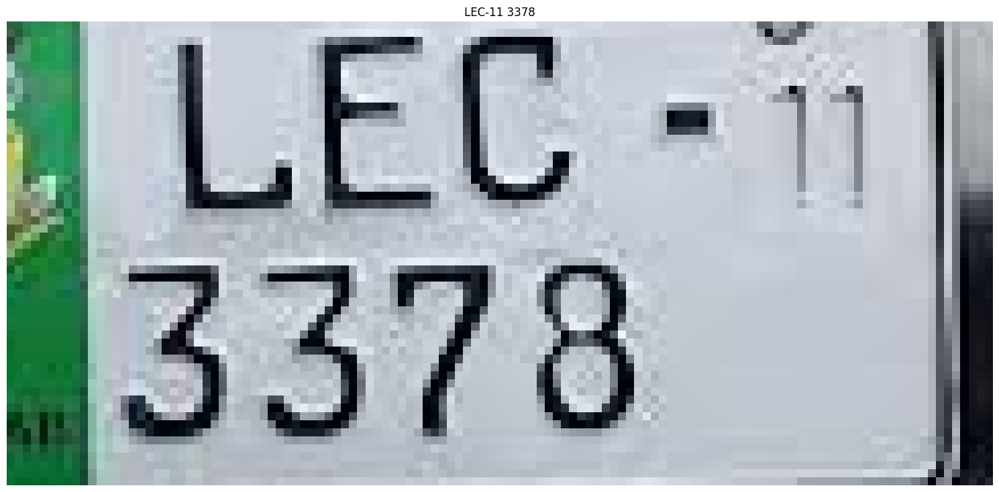

In [41]:
from paddleocr import PaddleOCR

def apply_ocr_to_images(cropped_images, ocr_model):
    extracted_texts = []
    for cropped_image in cropped_images:
        result = ocr_model.ocr(cropped_image, cls=False)
        text = " ".join([line[1][0] for line in result[0]])
        extracted_texts.append(text)
    return extracted_texts

# Initialize PaddleOCR
ocr = PaddleOCR(use_angle_cls=True, lang='en')

# Apply OCR to cropped images
extracted_texts = apply_ocr_to_images(cropped_images, ocr)

# Display the cropped images and extracted texts
fig, axs = plt.subplots(1, len(cropped_images), figsize=(15, 15))
if len(cropped_images) == 1:
    axs = [axs]  # Ensure axs is iterable

for ax, cropped_image, text in zip(axs, cropped_images, extracted_texts):
    cropped_image_rgb = cv2.cvtColor(cropped_image, cv2.COLOR_BGR2RGB)
    ax.imshow(cropped_image_rgb)
    ax.axis('off')
    ax.set_title(text)

plt.tight_layout()
plt.show()


# Testing on a Test Dataset

[2024/07/31 12:24:39] ppocr DEBUG: Namespace(help='==SUPPRESS==', use_gpu=False, use_xpu=False, use_npu=False, use_mlu=False, ir_optim=True, use_tensorrt=False, min_subgraph_size=15, precision='fp32', gpu_mem=500, gpu_id=0, image_dir=None, page_num=0, det_algorithm='DB', det_model_dir='C:\\Users\\mughe/.paddleocr/whl\\det\\en\\en_PP-OCRv3_det_infer', det_limit_side_len=960, det_limit_type='max', det_box_type='quad', det_db_thresh=0.3, det_db_box_thresh=0.6, det_db_unclip_ratio=1.5, max_batch_size=10, use_dilation=False, det_db_score_mode='fast', det_east_score_thresh=0.8, det_east_cover_thresh=0.1, det_east_nms_thresh=0.2, det_sast_score_thresh=0.5, det_sast_nms_thresh=0.2, det_pse_thresh=0, det_pse_box_thresh=0.85, det_pse_min_area=16, det_pse_scale=1, scales=[8, 16, 32], alpha=1.0, beta=1.0, fourier_degree=5, rec_algorithm='SVTR_LCNet', rec_model_dir='C:\\Users\\mughe/.paddleocr/whl\\rec\\en\\en_PP-OCRv4_rec_infer', rec_image_inverse=True, rec_image_shape='3, 48, 320', rec_batch_num=

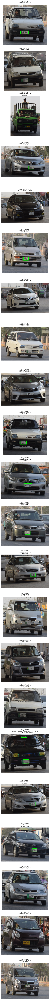

In [36]:
import os
import random
import cv2
import matplotlib.pyplot as plt
from ultralytics import YOLO
from paddleocr import PaddleOCR

def detect_objects(image, model, threshold=0.15):
    results = model(image)[0]
    detections = []
    cropped_images = []
    for x1, y1, x2, y2, score, class_id in results.boxes.data.tolist():
        if score > threshold:
            # Draw rectangle on image
            cv2.rectangle(image, (int(x1), int(y1)), (int(x2), int(y2)), (0, 255, 0), 4)
            
            # Crop detected object
            cropped_img = image[int(y1):int(y2), int(x1):int(x2)]
            cropped_images.append(cropped_img)
            
            detections.append((results.names[int(class_id)].upper(), score))
    return image, detections, cropped_images

def apply_ocr_to_images(cropped_images, ocr_model):
    extracted_texts = []
    for cropped_image in cropped_images:
        result = ocr_model.ocr(cropped_image, cls=False)
        if result and result[0]:  # Check if result and result[0] are not None
            text = " ".join([line[1][0] for line in result[0] if line[1]])
        else:
            text = "No text detected"
        extracted_texts.append(text)
    return extracted_texts

def process_images(folder_path, model, ocr_model, num_images=16, threshold=0.4):
    image_files = [f for f in os.listdir(folder_path) if os.path.isfile(os.path.join(folder_path, f))]
    selected_images = random.sample(image_files, num_images)
    
    rows = (num_images + 3) // 1  # Calculate the number of rows needed
    fig, axs = plt.subplots(rows, 1, figsize=(5, 110))
    axs = axs.flatten()  # Ensure axs is a 1D array
    
    for i, image_file in enumerate(selected_images):
        image_path = os.path.join(folder_path, image_file)
        image = cv2.imread(image_path)
        detected_image, detections, cropped_images = detect_objects(image, model, threshold)
        detected_image_rgb = cv2.cvtColor(detected_image, cv2.COLOR_BGR2RGB)
        
        # Apply OCR to cropped images
        extracted_texts = apply_ocr_to_images(cropped_images, ocr_model)
        
        # Combine detection and OCR text
        detection_text = ", ".join([f'{cls} ({score:.2f})' for cls, score in detections]) if detections else "No detections"
        ocr_text = " | ".join(extracted_texts) if extracted_texts else "No OCR results"
        
        ax = axs[i]
        ax.imshow(detected_image_rgb)
        ax.axis('off')
        
        ax.set_title(f'{image_file}\n{detection_text}\n{ocr_text}', fontsize=8)
    
    for j in range(i + 1, len(axs)):
        fig.delaxes(axs[j])  # Remove any unused subplots
    
    plt.tight_layout()
    plt.show()

# Initialize YOLO model and PaddleOCR
model = YOLO(os.path.join('.', 'best.pt'))
ocr = PaddleOCR(use_angle_cls=True, lang='en')

# Folder path containing images
folder_path = r'C:\Users\mughe\ml1\!ML 1 Bootcamp\Number_Plate_Retreival\cart_testing'

# Process and plot images
process_images(folder_path, model, ocr, num_images=22)
